In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pandas_profiling as pdp
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import json
warnings.simplefilter('ignore')
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 100)

In [2]:
# LOAD DATA
INPUT_DIR  = '../../input/lv9'
LOG_NAME = '06_28_14_29_29'
predicted = np.load(f"../log/{LOG_NAME}/pred_valid.npy") # (70,28)
test = np.load(f"../log/{LOG_NAME}/pred_test.npy")  # (70,28)
json_load = json.load(open(f'../log/{LOG_NAME}/params.json', 'r'))

In [4]:
# load data
sales_array = np.load('../../../input/lv9/sales_array.npy') # (70,1,1936)

# make numeric input
use_days = json_load['use_days']
sales_train_x = sales_array[:, 0, -1 * (28 + use_days) : -28*2]

# fit for train sales
mm = MinMaxScaler(feature_range=(0.05, 0.95))
mm.fit(sales_train_x.T)

# inverse transform
predicted_inv = mm.inverse_transform(predicted.T).T
test_inv = mm.inverse_transform(test.T).T

In [5]:
# check value
print(sales_train_x.max())
print(sales_train_x.min())
print(predicted_inv.max())
print(predicted_inv.min())
print(test_inv.max())
print(test_inv.min())

5118.0
0.0
3847.1448
11.986473
3846.5728
13.133526


# predicted_dfを作る

In [8]:
sales_df = pd.read_csv('../../../input/m5-forecasting-accuracy/sales_train_evaluation.csv')
store_list = sales_df['store_id'].value_counts().index.tolist()
store_list.sort()
dept_list = sales_df['dept_id'].value_counts().index.tolist()
dept_list.sort()

In [9]:
store_index_list=[]
dept_index_list=[]
for store in store_list:
    for dept in dept_list:
        store_index_list.append(store)
        dept_index_list.append(dept)

In [10]:
predicted_df=pd.DataFrame(np.concatenate([predicted_inv,test_inv],axis=1), columns=[f'd_{i+1914}' for i in range(56)])

In [11]:
predicted_df['store_id']=store_index_list
predicted_df['dept_id']=dept_index_list
predicted_df['cat_id']=predicted_df['dept_id'].apply(lambda x: x[:-2])
predicted_df['state_id']=predicted_df['store_id'].apply(lambda x: x[:-2])

In [12]:
predicted_df=predicted_df.loc[:,['dept_id','cat_id','store_id','state_id']+[f'd_{i+1914}' for i in range(56)]]

In [13]:
predicted_df

,dept_id,cat_id,store_id,state_id,d_1914,d_1915,d_1916,d_1917,d_1918,d_1919,d_1920,d_1921,d_1922,d_1923,d_1924,d_1925,d_1926,d_1927,d_1928,d_1929,d_1930,d_1931,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941,d_1942,d_1943,d_1944,d_1945,d_1946,d_1947,d_1948,d_1949,d_1950,d_1951,d_1952,d_1953,d_1954,d_1955,d_1956,d_1957,d_1958,d_1959,d_1960,d_1961,d_1962,d_1963,d_1964,d_1965,d_1966,d_1967,d_1968,d_1969
0,FOODS_1,FOODS,CA_1,CA,250.451385,249.784225,261.335083,305.884918,345.545258,332.303009,313.950806,279.685852,246.478287,262.073669,279.505493,365.321075,396.755859,347.150055,277.648132,264.583160,283.759766,302.981354,350.010620,353.858398,328.766510,266.464508,285.636688,293.709137,296.039703,366.230469,403.024811,362.174713,276.642761,279.714417,289.446411,330.720001,349.010498,352.916168,315.832367,304.954926,231.240784,276.777008,300.625549,386.125275,401.270111,358.003448,270.121674,272.066742,299.369843,322.762573,366.136078,363.584900,373.987701,269.548767,308.582581,315.703674,305.378235,385.027924,413.738892,369.021210
1,FOODS_2,FOODS,CA_1,CA,466.719208,425.472809,402.550568,465.075653,527.131714,657.072632,756.337463,585.227783,521.965149,514.264038,479.780579,540.132019,738.743347,773.803467,574.896729,497.608459,453.133698,481.602478,491.919098,564.527954,674.580261,518.395935,475.294159,458.536682,433.903900,491.410217,601.695740,700.027161,495.766266,456.757629,426.376984,490.618469,545.575378,660.414368,719.715149,581.741760,496.568329,508.887146,496.657806,549.548462,717.166992,744.214111,546.353577,472.490997,461.777740,494.248444,499.522247,568.554688,692.732178,504.292908,494.624939,473.154541,444.906982,514.325012,628.054260,687.396423
2,FOODS_3,FOODS,CA_1,CA,1898.586060,1880.068237,1798.229126,1970.058472,2288.868652,2764.632324,2981.566406,2196.715088,1998.656372,1969.871216,1908.153931,2348.765381,3000.760010,2932.271973,2198.007812,1891.367432,1886.174194,1979.035767,2141.360107,2604.703613,2854.845947,2221.211426,2027.076416,1969.046387,1889.007324,2192.712402,2831.304688,2880.244385,2055.223145,2010.857422,1928.357666,2123.242432,2385.448975,2845.702881,2906.494141,2225.776611,1907.945435,2020.827148,1984.779907,2410.492920,2974.997803,2885.560059,2135.310059,1902.065430,1978.005249,2055.446533,2246.256836,2618.021729,2982.331299,2195.970703,2126.126465,2064.353027,1969.245728,2333.000000,2936.430664,2885.383301
3,HOBBIES_1,HOBBIES,CA_1,CA,467.639984,418.729095,398.541718,474.396332,608.307678,596.062256,614.823914,486.961700,418.230011,417.269928,412.614166,519.426392,623.295715,604.676086,465.345734,416.094208,417.106201,474.083862,499.690338,581.313721,604.772156,428.262665,479.939056,464.082703,443.845978,533.996704,640.077271,605.361877,488.901093,446.441742,421.952881,481.005829,590.387939,604.175293,588.054626,487.105865,385.492706,424.362274,411.370789,538.027100,605.770752,594.095642,434.385101,395.032806,423.942566,484.995819,507.862396,560.955566,638.652710,411.880951,488.892273,475.213013,442.972656,550.398193,644.646301,615.143677
4,HOBBIES_2,HOBBIES,CA_1,CA,33.460938,35.950745,38.683605,42.056885,40.774273,48.729389,42.063240,41.149872,29.386290,35.487404,40.182266,43.901154,48.240513,52.604816,34.483158,34.503231,40.370674,41.520210,42.437794,40.449127,52.649567,33.083584,38.755085,37.918213,36.225327,45.528908,48.087978,57.422459,36.348122,39.425621,40.620628,44.920200,48.319981,52.516663,42.353180,44.416286,30.958618,37.233849,44.126991,48.520382,51.763477,51.216946,34.777477,34.740025,42.573349,43.626408,45.161484,43.541782,55.213463,33.278511,42.322628,39.886787,38.366325,50.354557,53.746906,55.738834
5,HOUSEHOLD_1,HOUSEHOLD,CA_1,CA,702.302002,667.152832,642.383972,720.829895,882.827393,1076.821289,1124.297363,787.152222,686.992615,693.879333,668.177551,804.729187,1078.919434,1076.709717,773.147034,667.346924,637.327148,691.763062,761.016846,941.636414,1051.556519,723.560913,730.360535,703.468750,645.292786,782.514832,1048.448486,1091.784302,749.431335,702.4691

In [14]:
pub_cols = [f'd_{i+1914}' for i in range(28)]
pri_cols = [f'd_{i+1942}' for i in range(28)]

# LOSS SUMMARY

In [15]:
group_list = [
[],
['state_id'],
['store_id'],
['cat_id'],
['dept_id'],
['state_id', 'cat_id'],
['state_id', 'dept_id'],
['store_id', 'cat_id'],
['store_id', 'dept_id']
]

for i, group in enumerate(group_list):
    if i == 0:
        pub = predicted_df[pub_cols].values.sum(axis=0)
        target = sales_df[pub_cols].values.sum(axis=0)
        print('lv1 RMSE:',np.sqrt(mean_squared_error(pub, target)))
    else:
        predicted_df.groupby(group).sum()
        pub = predicted_df.groupby(group).sum()[pub_cols].values
        target = sales_df.groupby(group).sum()[pub_cols].values
        print(f'lv{i+1} RMSE:',np.sqrt(mean_squared_error(pub, target)))

lv1 RMSE: 3741.8407230041066
lv2 RMSE: 1473.411556577256
lv3 RMSE: 541.8759457286648
lv4 RMSE: 1708.0561373161097
lv5 RMSE: 823.5903243744408
lv6 RMSE: 695.4496057587158
lv7 RMSE: 339.10194949242947
lv8 RMSE: 262.41786309847134
lv9 RMSE: 134.56577093987164


# LB plot

lv1 RMSE: 3741.8407230041066


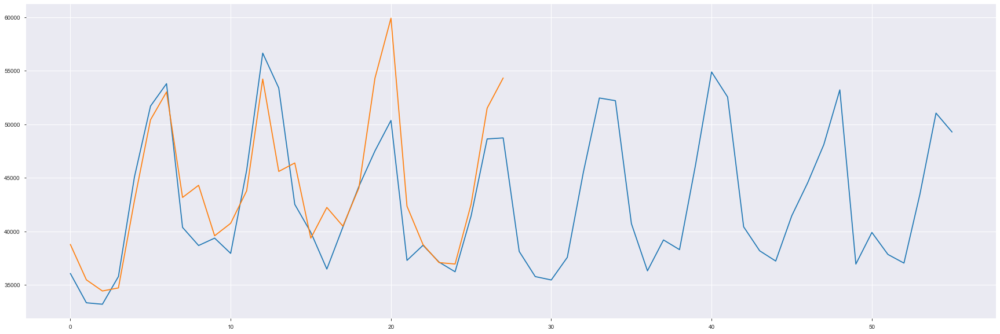

In [104]:
# lv1
pub = predicted_df[pub_cols].values.sum(axis=0)
target = sales_df[pub_cols].values.sum(axis=0)
print('lv1 RMSE:',np.sqrt(mean_squared_error(pub, target)))
f, ax = plt.subplots(figsize=(30, 10))
plt.plot(predicted_df[pub_cols+pri_cols].values.sum(axis=0))
plt.plot(target)
plt.show()

lv2 RMSE: 1473.411556577256


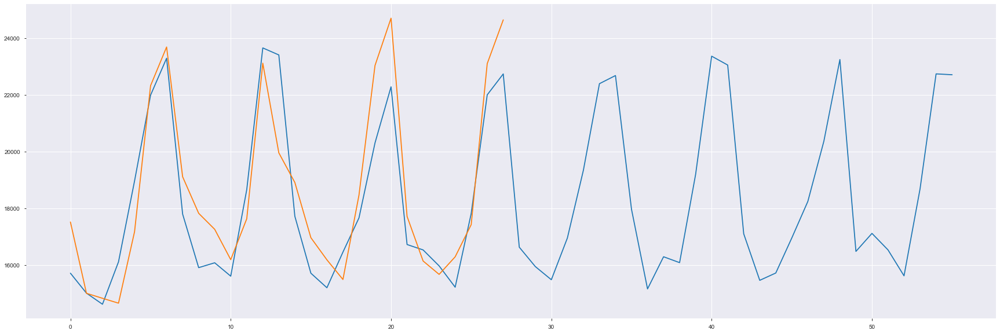

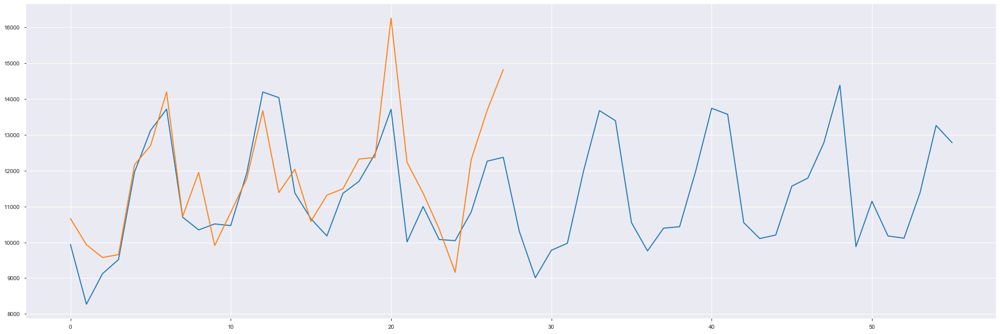

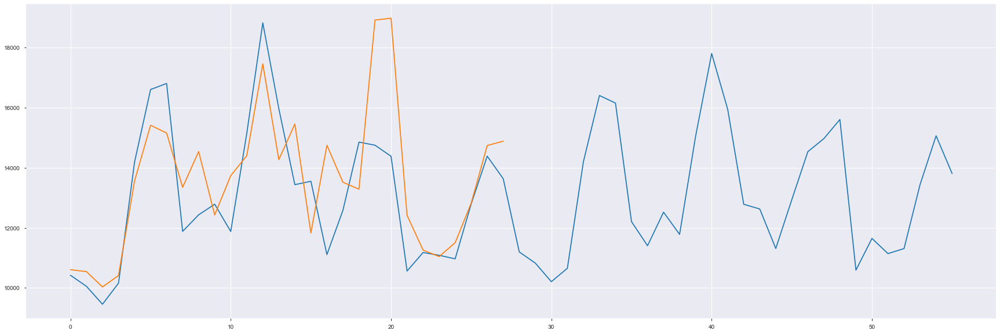

In [115]:
# lv2
group = ['state_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv2 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv3 RMSE: 541.8759457286648


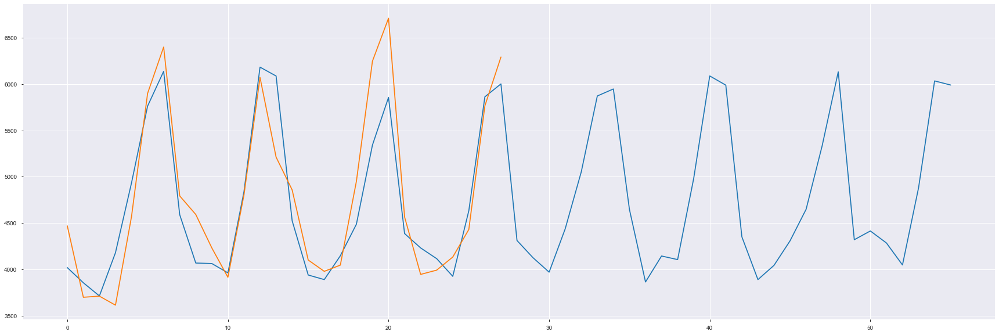

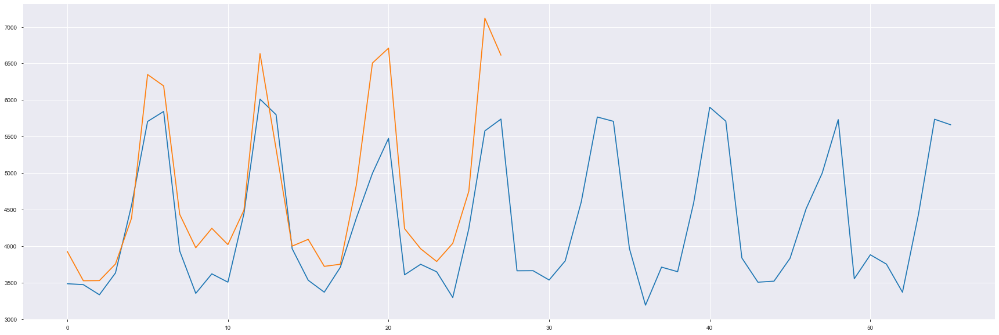

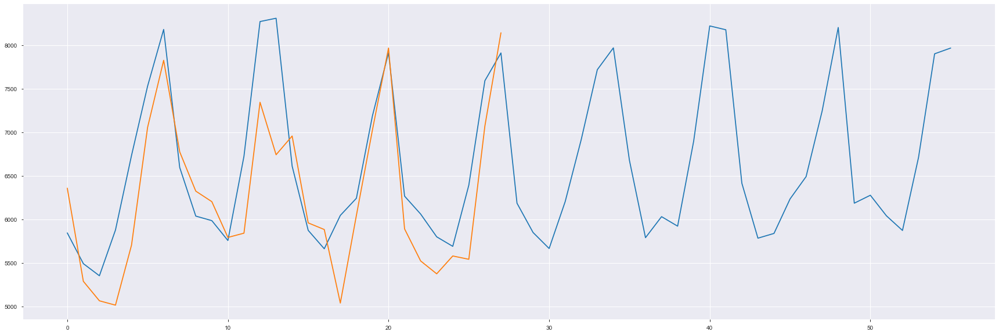

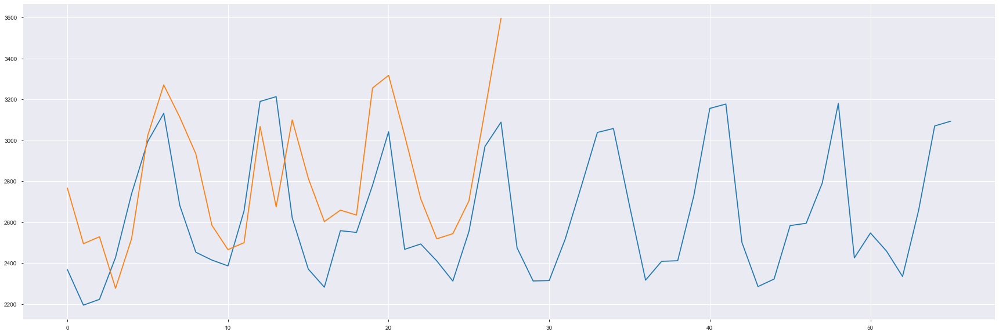

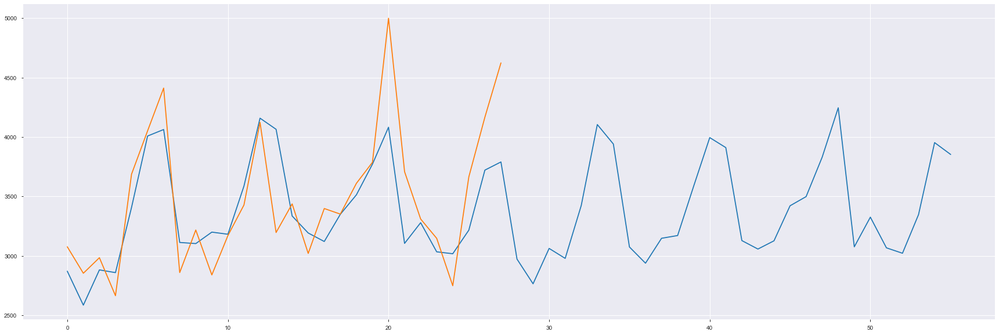

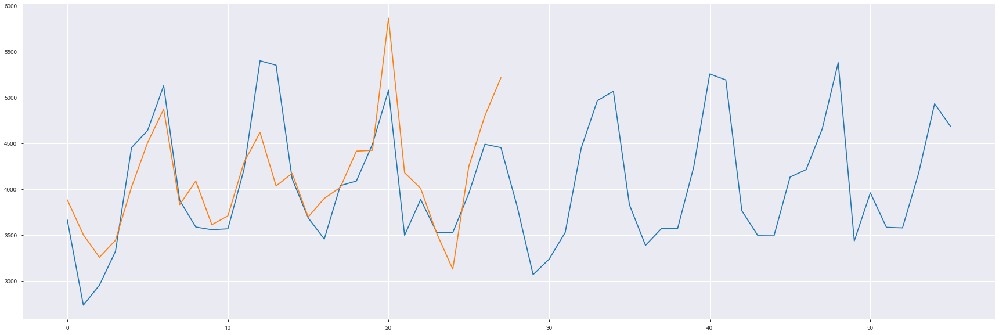

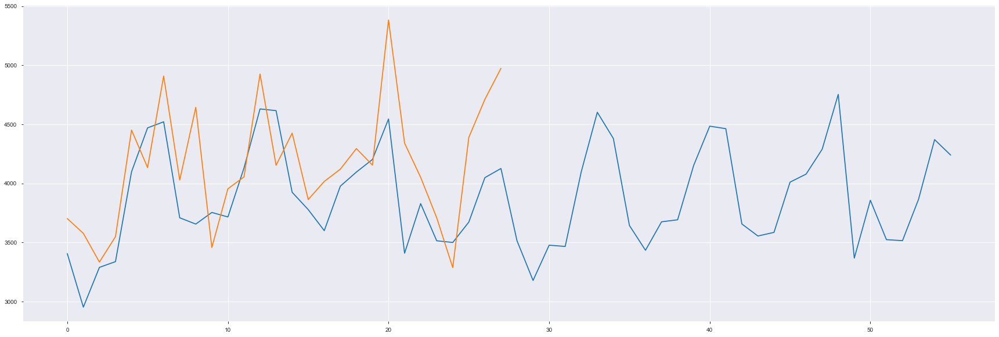

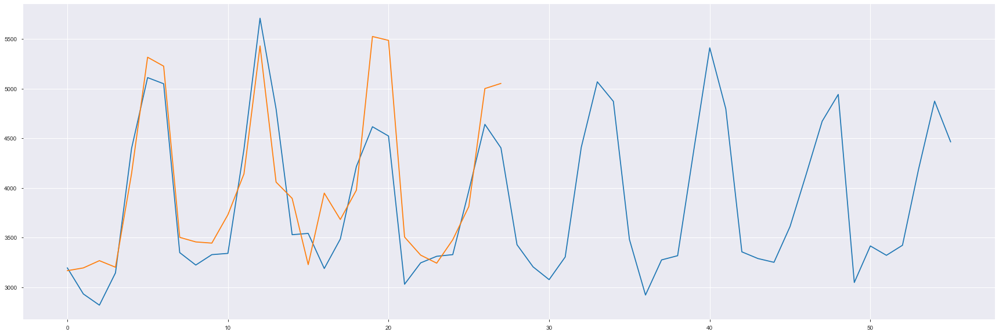

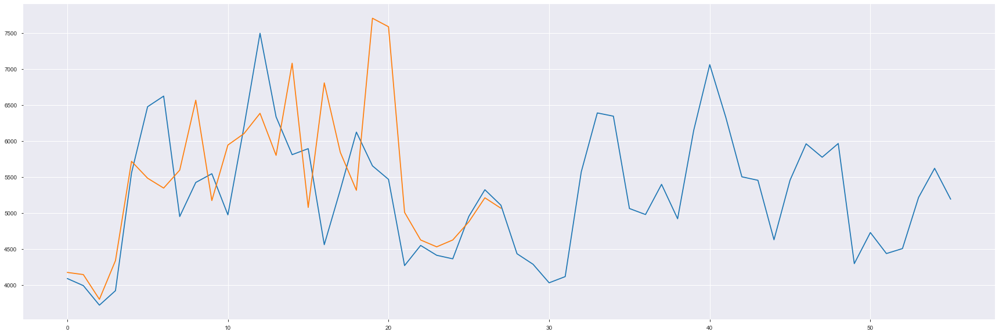

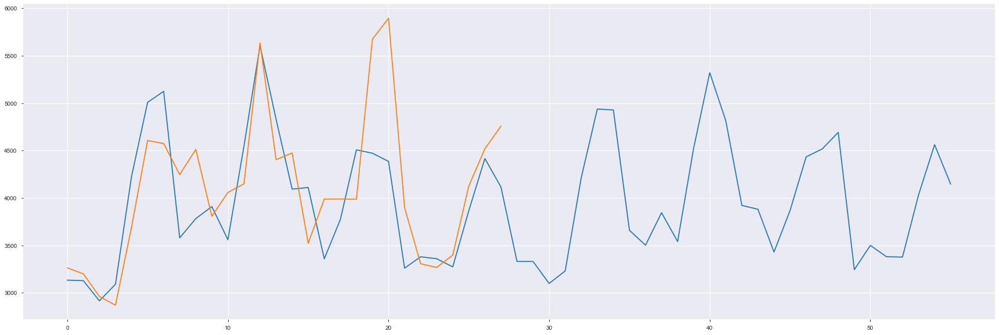

In [116]:
# lv3
group = ['store_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv3 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv4 RMSE: 1708.0561373161097


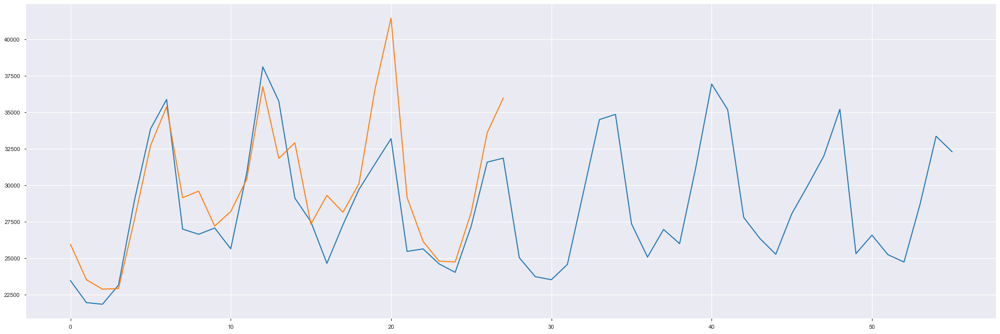

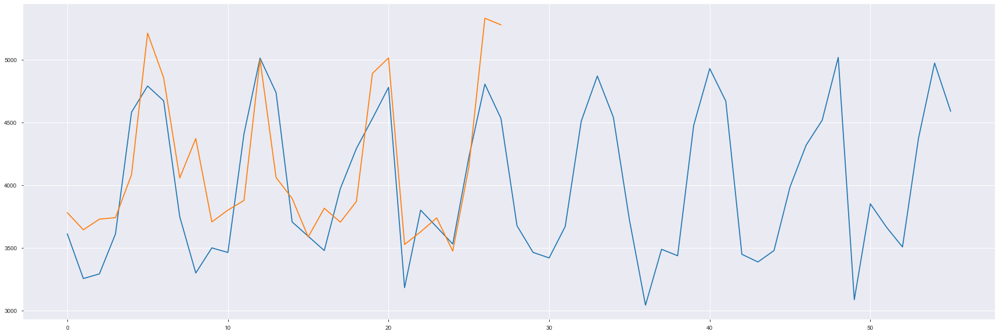

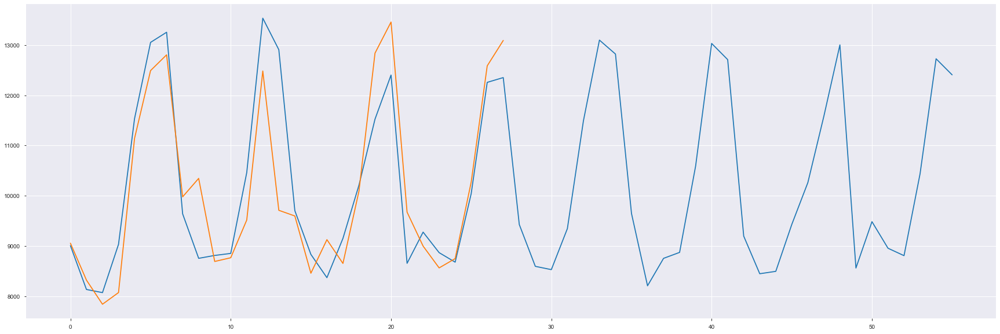

In [118]:
# lv4
group = ['cat_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv4 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv5 RMSE: 823.5903243744408


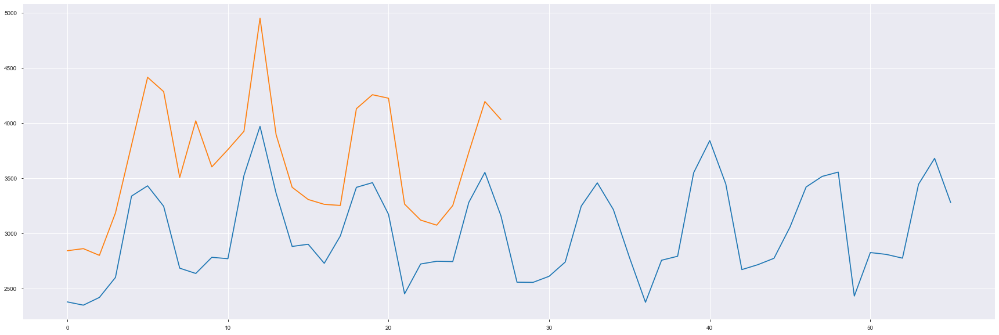

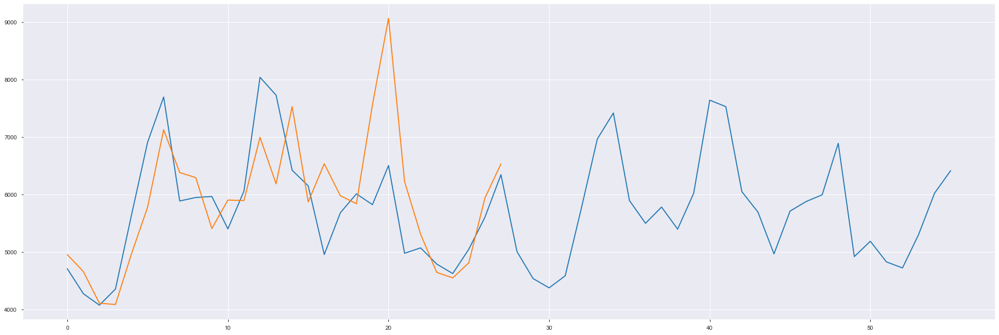

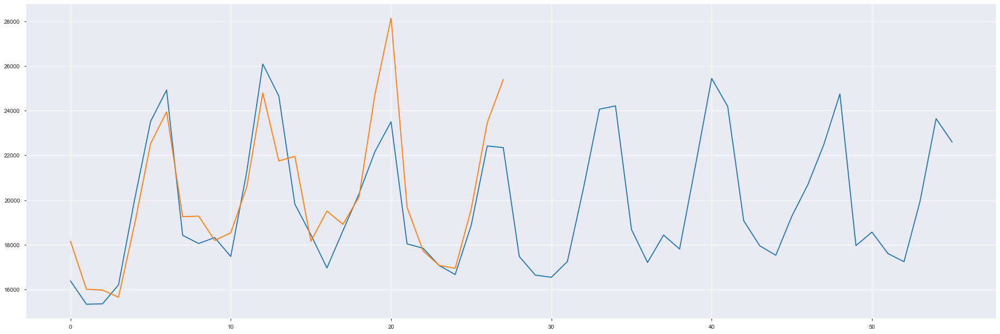

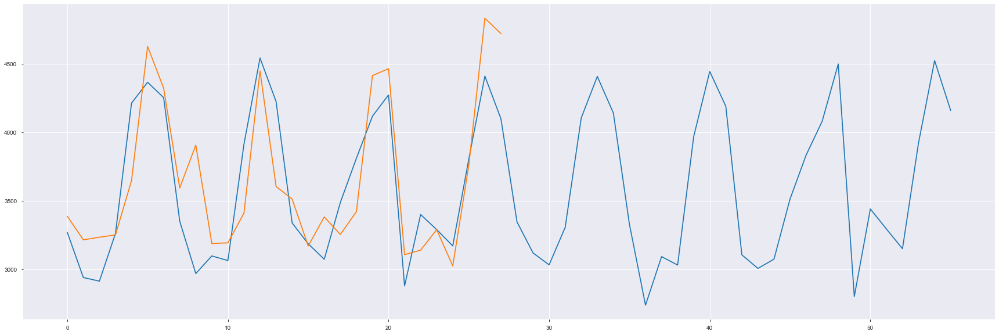

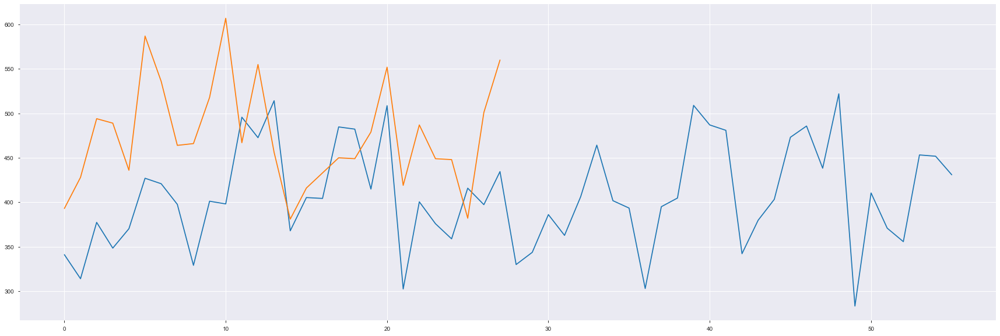

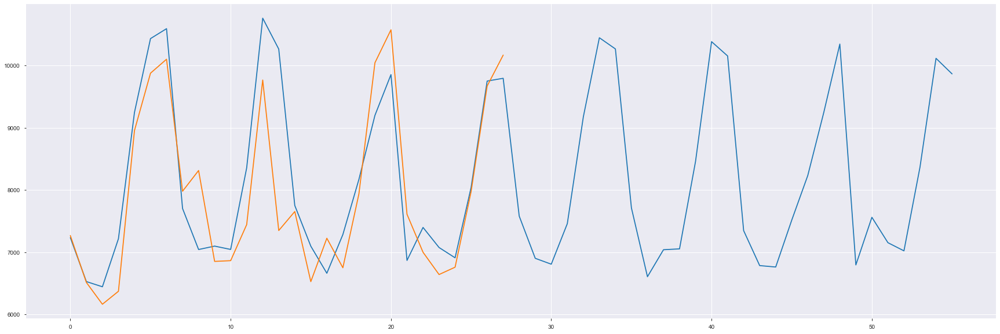

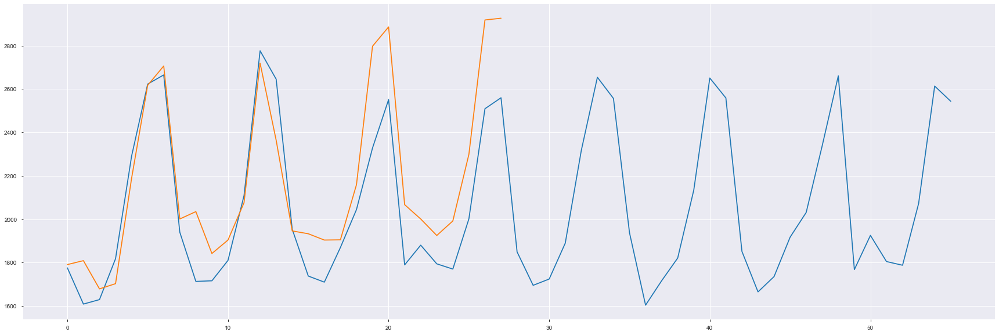

In [119]:
# lv5
group = ['dept_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv5 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv6 RMSE: 695.4496057587158


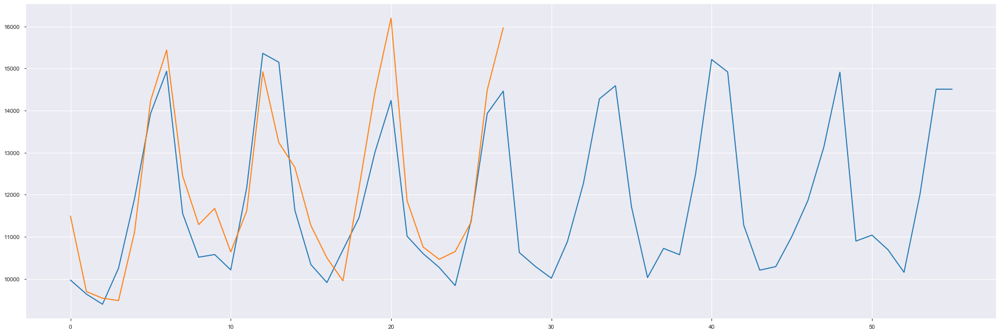

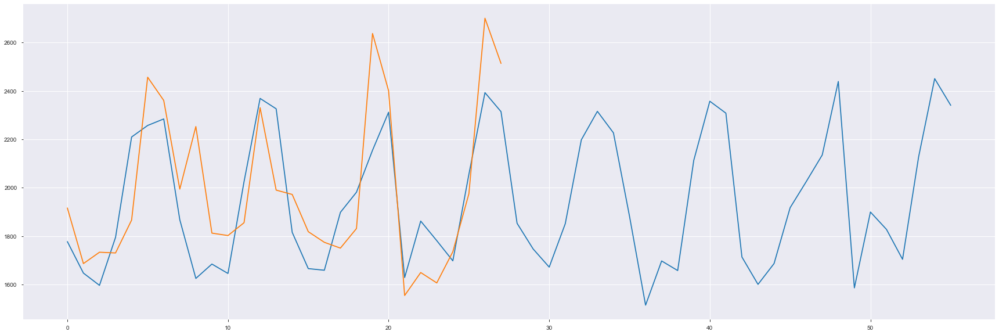

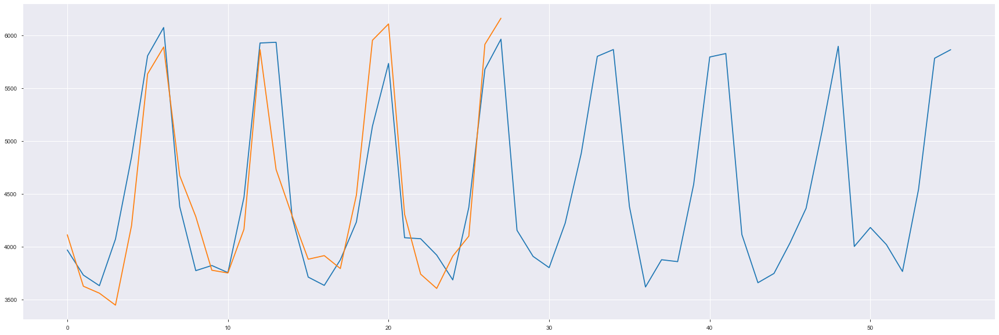

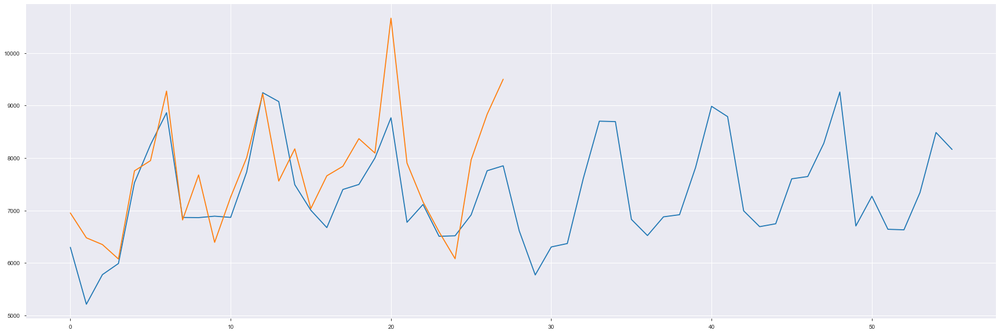

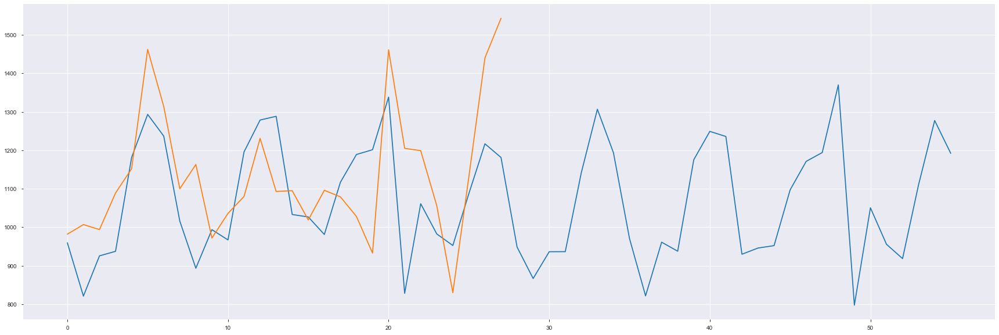

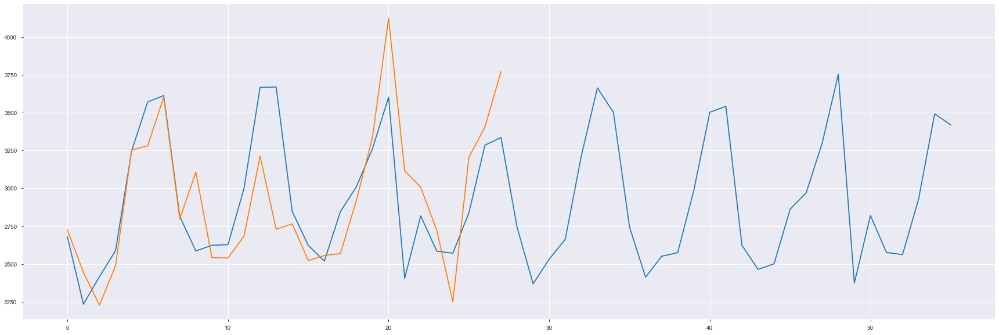

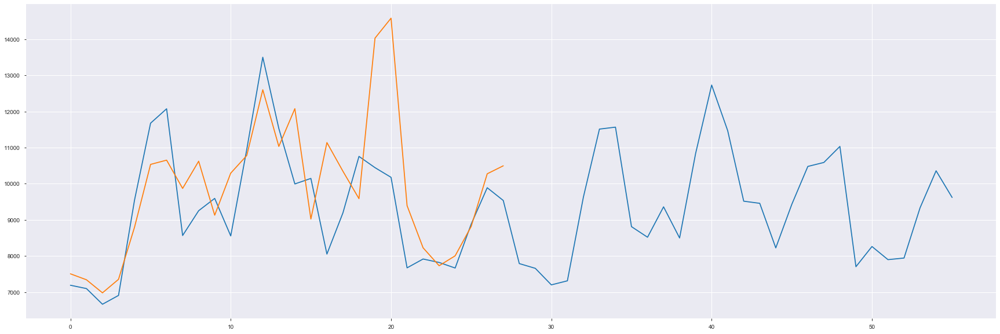

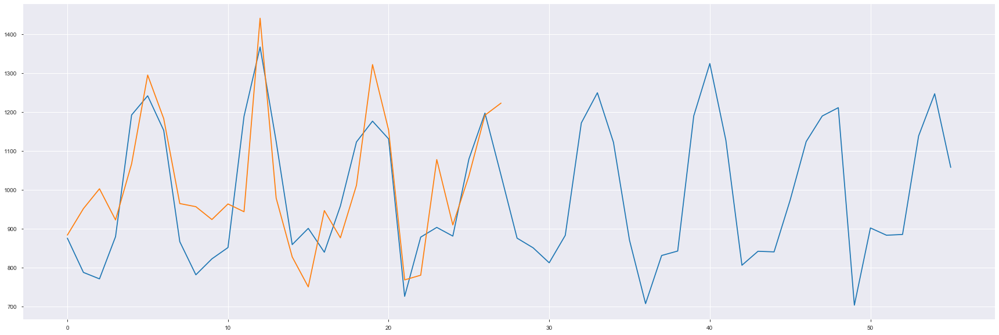

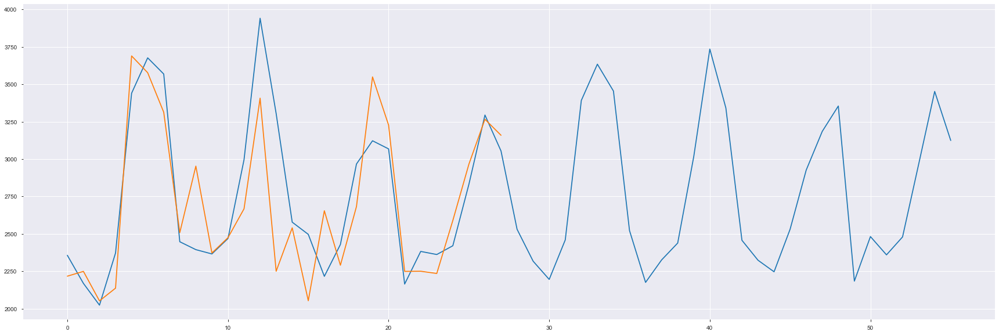

In [120]:
# lv6
group = ['state_id', 'cat_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv6 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv7 RMSE: 339.10194949242947


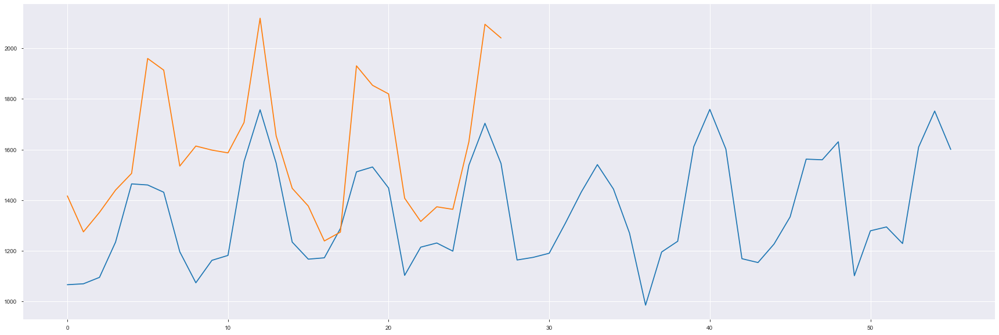

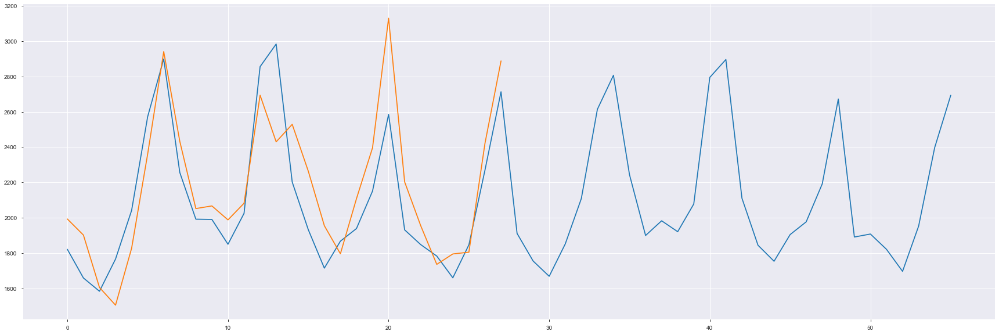

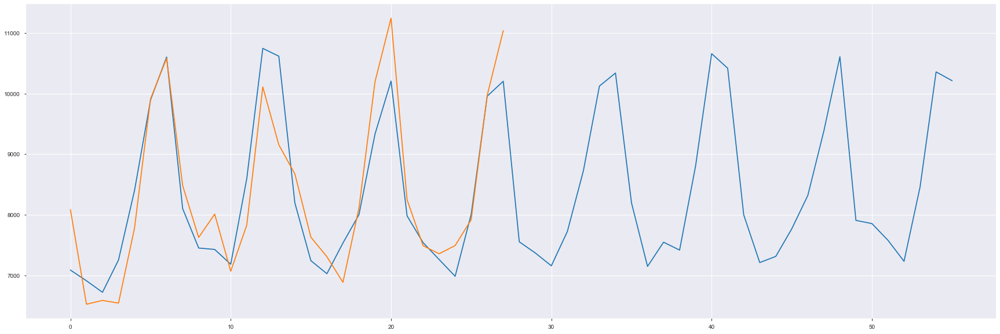

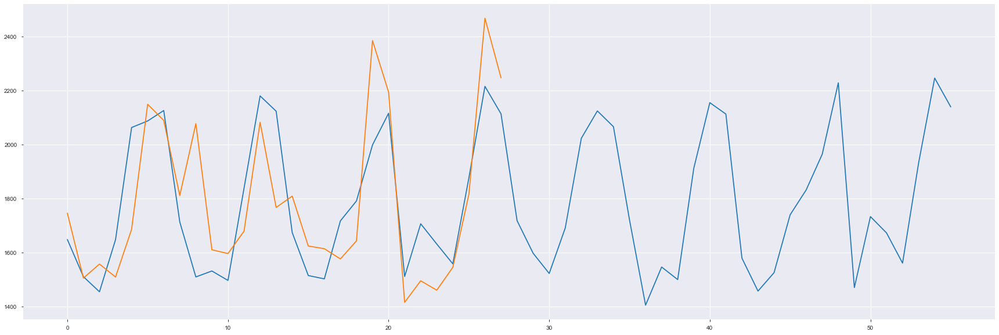

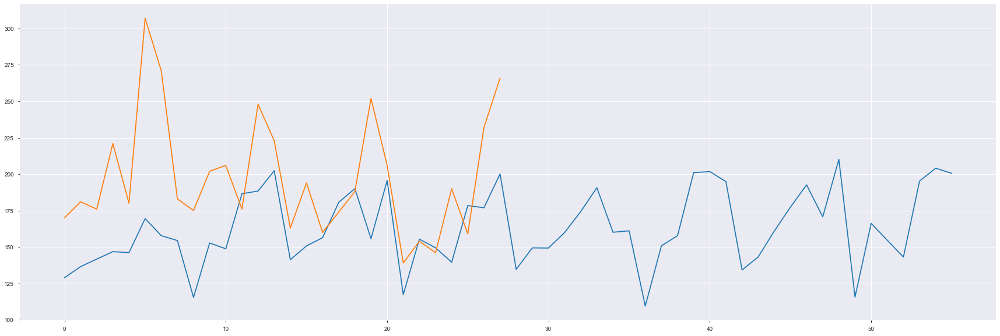

...

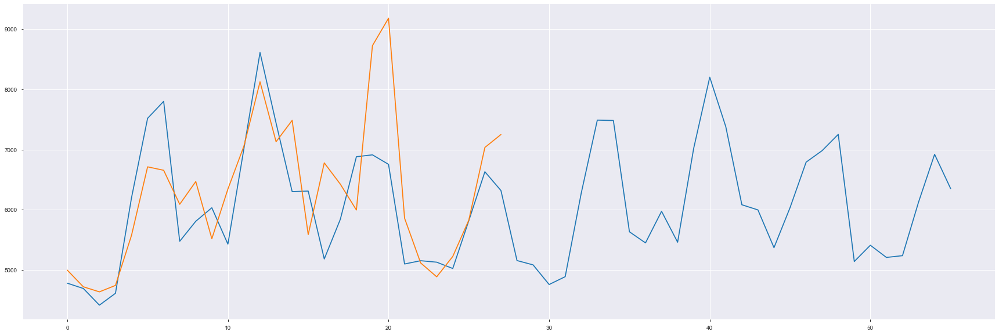

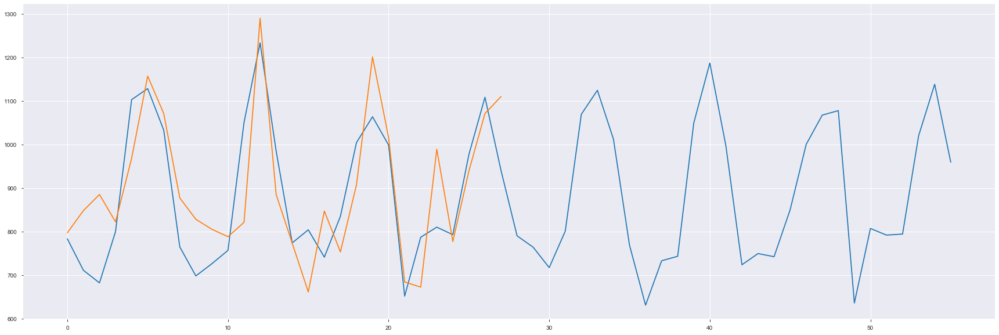

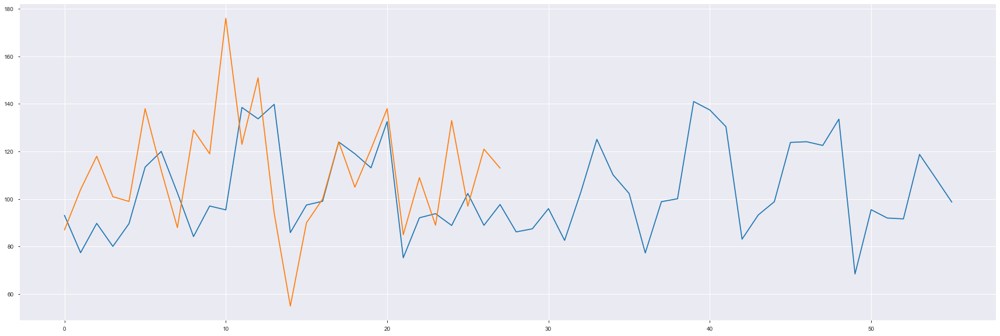

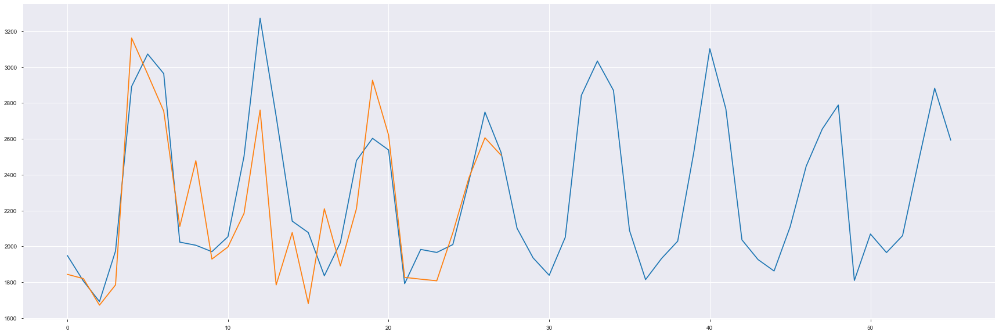

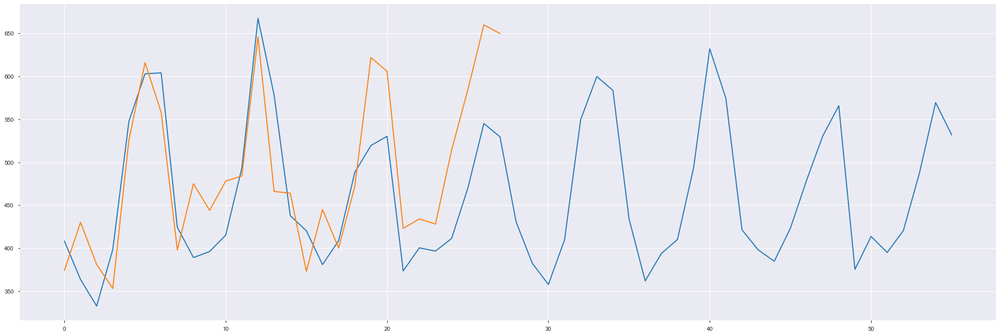

In [122]:
# lv7
group = ['state_id', 'dept_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv7 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv8 RMSE: 262.41786309847134


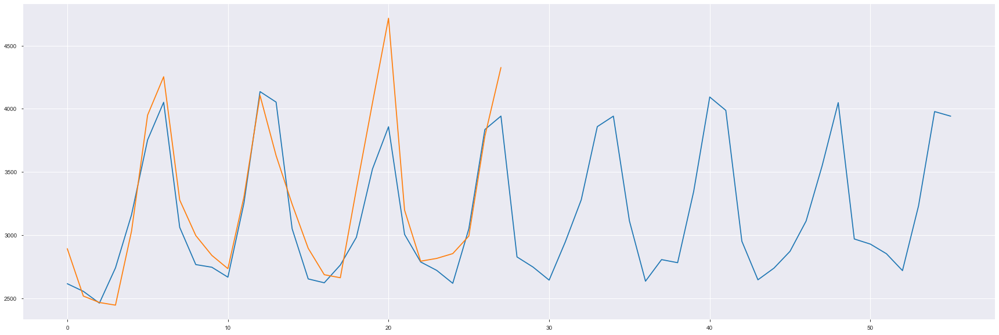

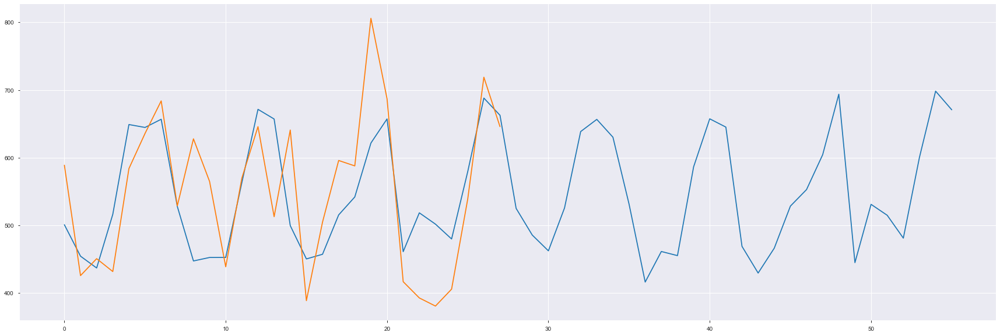

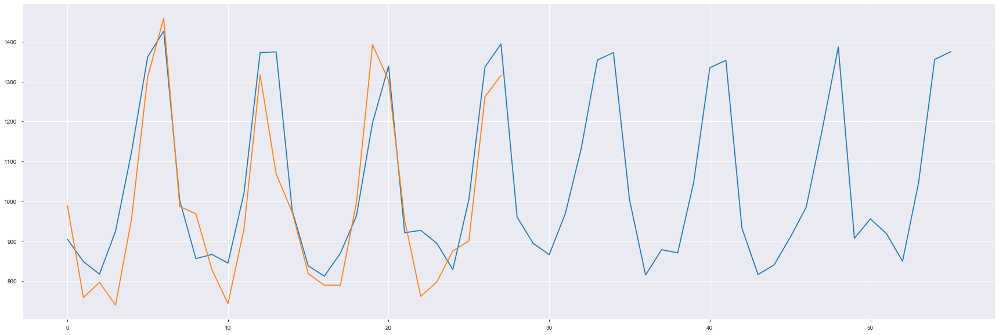

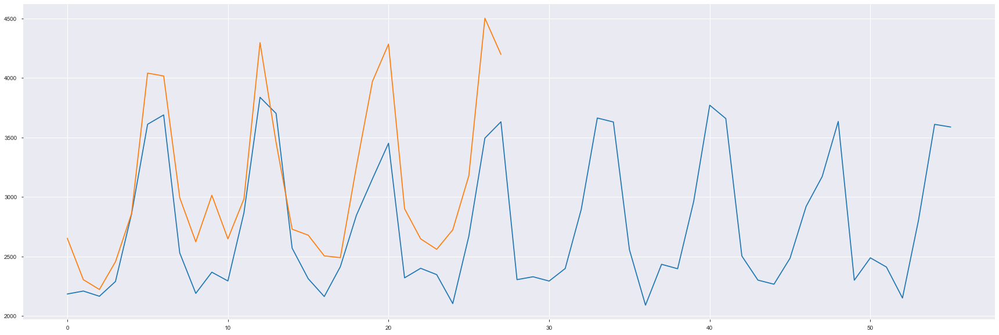

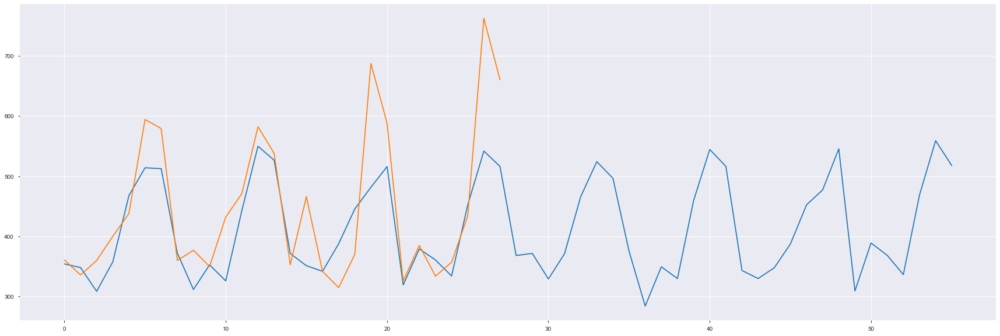

...

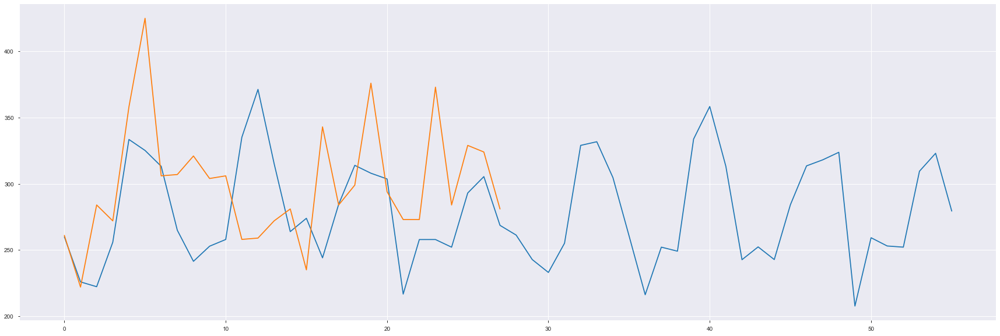

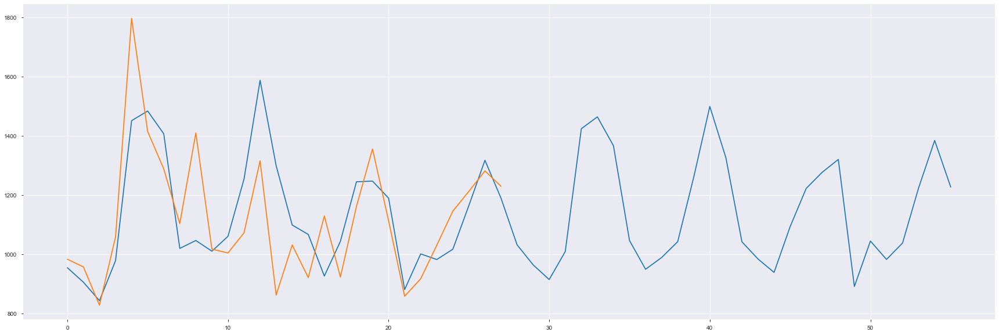

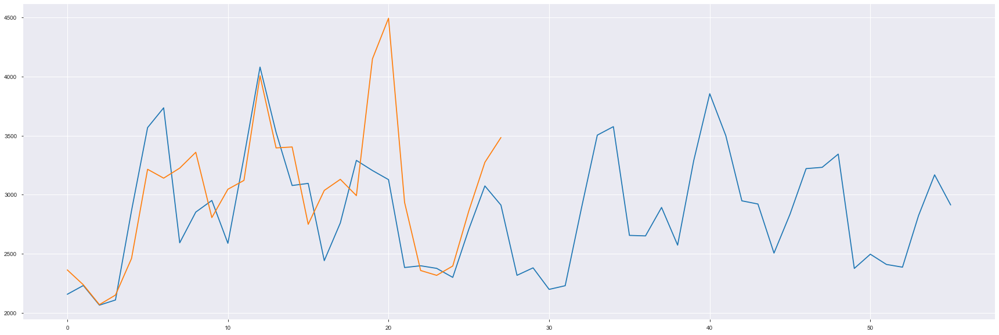

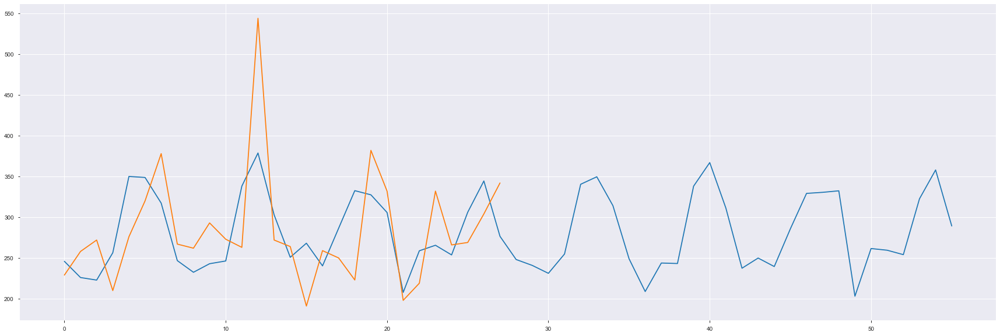

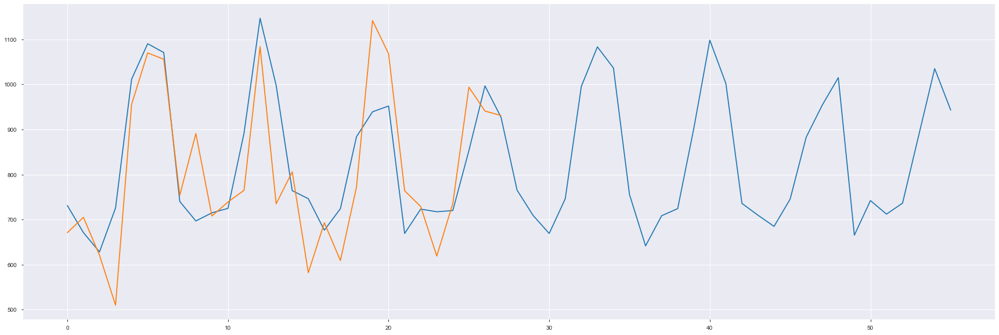

In [123]:
# lv8
group = ['store_id', 'cat_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv8 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()

lv9 RMSE: 134.56577093987164


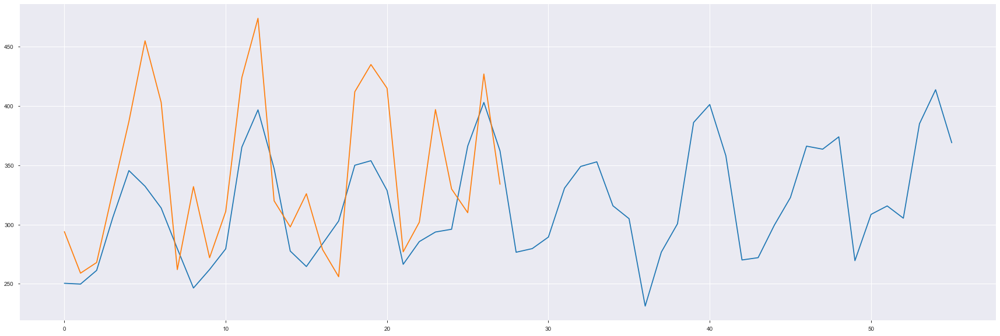

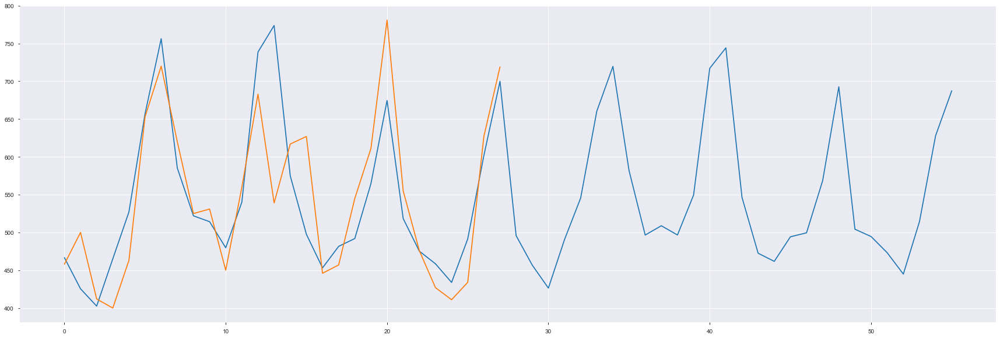

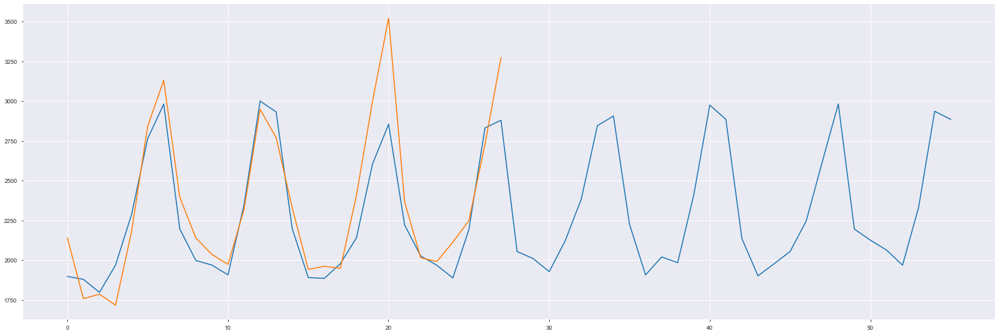

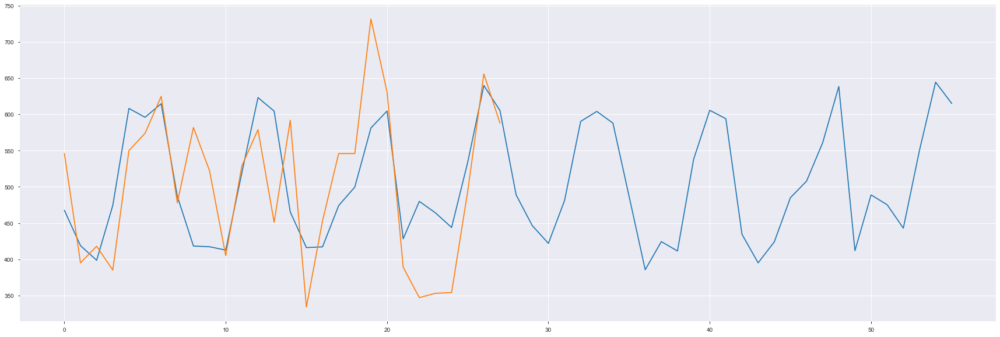

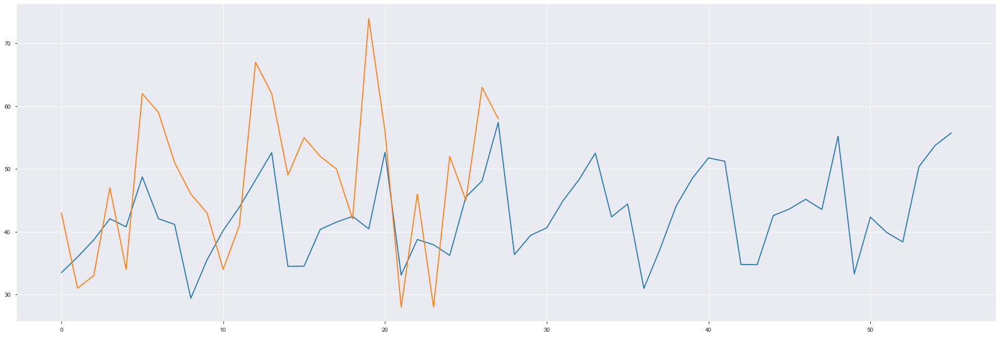

...

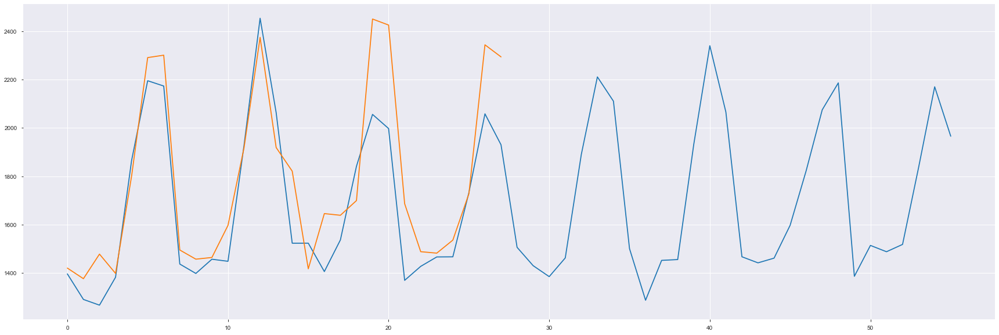

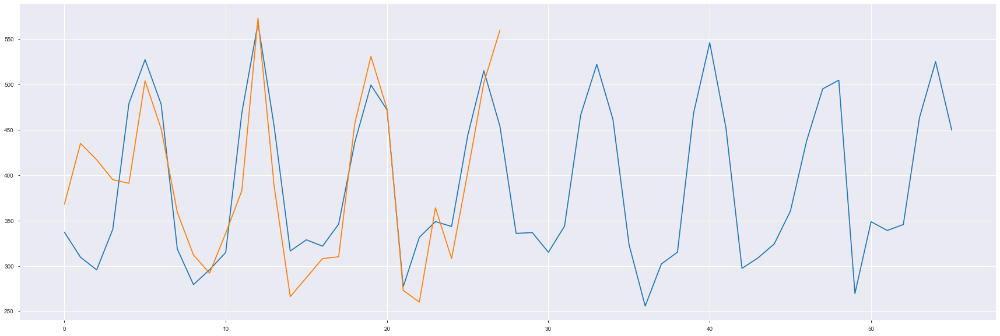

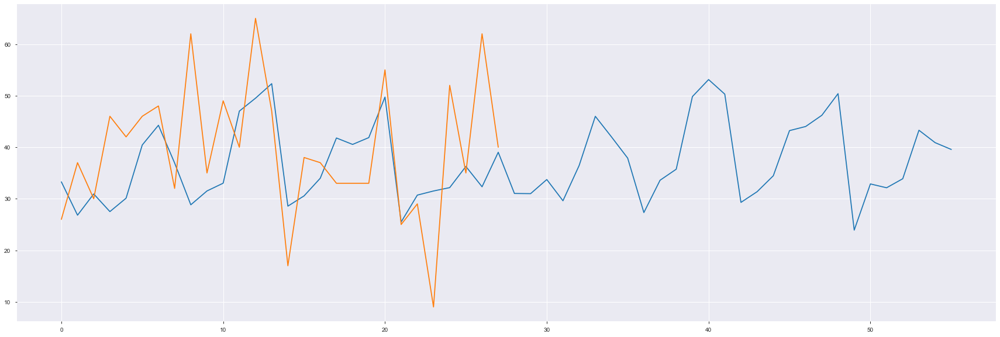

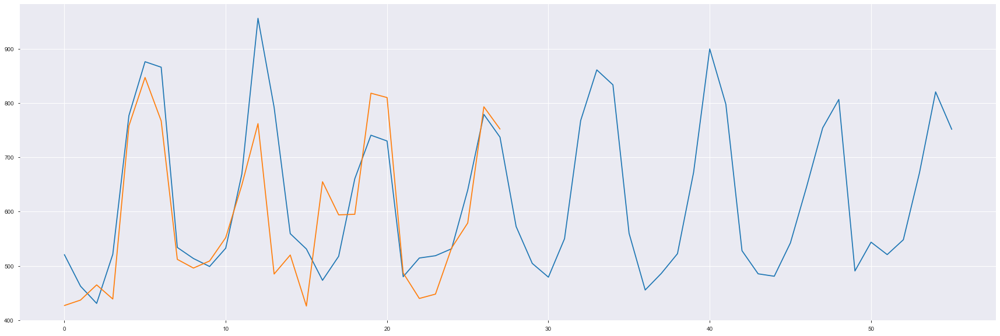

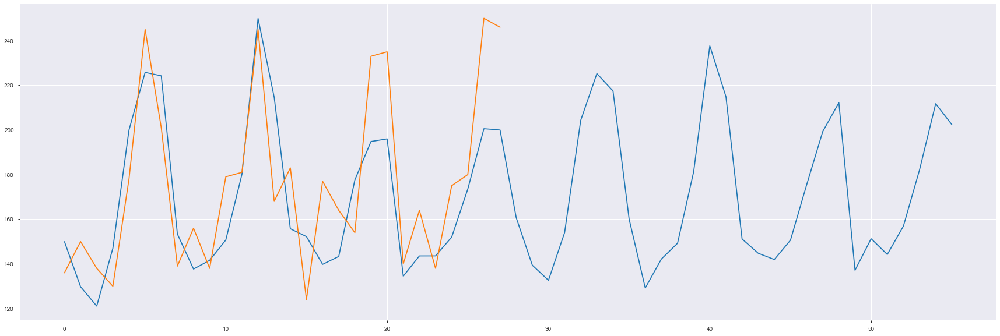

In [ ]:
# lv9
group = ['store_id', 'dept_id']
predicted_df.groupby(group).sum()

pub = predicted_df.groupby(group).sum()[pub_cols].values
target = sales_df.groupby(group).sum()[pub_cols].values
print('lv9 RMSE:',np.sqrt(mean_squared_error(pub, target)))
for i in range(pub.shape[0]):
    f, ax = plt.subplots(figsize=(30, 10))
    plt.plot(predicted_df.groupby(group).sum()[pub_cols+pri_cols].values[i])
    plt.plot(sales_df.groupby(group).sum()[pub_cols].values[i])
    plt.show()